In [12]:
import transformers
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np
import os
import re
import random
import datasets
from datasets import load_dataset
from abc import ABC, abstractmethod
from typing import List, Optional, Tuple, Dict
from tqdm import tqdm
import pickle
from dotenv import load_dotenv
import openai
import json
import gc

from typing import List, Optional, Tuple, Dict
from transformers import AutoModelForCausalLM, AutoTokenizer
import datasets
from datasets import Dataset
from datasets import load_from_disk, DatasetDict

import plotly.graph_objects as go
import plotly.express as px

from utils import untuple, eval_completions
from act_add.contrast_dataset import ContrastDataset
from scripts.get_activations import gen_pile_data, compare_token_lists, slice_acts
from act_add.model_wrapper import ModelWrapper
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
path = 'data/6.9b'
model_name_or_path = "EleutherAI/pythia-6.9b"

all_mem_69b_data = pd.read_csv(f'{path}/mem_evals_gen_data.csv')
all_mem_69b_data

,gen,ground,tok_by_tok_sim,char_by_char_sim,lev_distance,toks,source,orig_index
0,"xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...","xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...",1.000000,1.000000,1.000000,"[18728, 27, 2703, 3, 1054, 26600, 2244, 568, 1...",pythia-evals,0
1,(contacts == null)? null : contacts.get(i);\n...,(contacts == null)? null : contacts.get(i);\n...,0.765625,0.692308,0.772277,"[313, 1987, 10719, 2295, 3635, 10, 3736, 3635,...",pythia-evals,1
2,": lv.php,v 1.3 2005/10/03 15:07:27 mike Exp $\...",": lv.php,v 1.3 2005/10/03 15:07:27 mike Exp $\...",0.578125,0.547009,0.796053,"[27, 298, 87, 15, 5581, 13, 87, 337, 15, 20, 5...",pythia-evals,2
3,cdcdc; text-align:center| Midfielders\n\n|-\n!...,cdcdc; text-align:center| Midfielders\n\n|-\n!...,1.000000,1.000000,1.000000,"[2428, 2428, 68, 28, 2505, 14, 8623, 27, 9229,...",pythia-evals,3
4,"\n\t\t<read echo=""ascii""><delim>\\n</delim><ma...","\n\t\t<read echo=""ascii""><delim>\\n</delim><ma...",1.000000,1.000000,1.000000,"[996, 186, 29, 1088, 7392, 568, 29860, 5264, 2...",pythia-evals,4
...,...,...,...,...,...,...,...,...
19995,San Francisco’s towers and Silicon Valley’s sp...,San Francisco’s towers and Silicon Valley’s sp...,0.500000,0.570815,0.639286,"[19346, 10765, 457, 84, 27731, 285, 34413, 109...",pile,9995
19996,With the development of network information te...,With the development of network information te...,0.515625,0.570370,0.678899,"[3378, 253, 2440, 273, 2990, 1491, 4302, 13, 6...",pile,9996
19997,"404 22 nd Street Brigantine, NJ 08203\n\n$5,75...","404 22 nd Street Brigantine, NJ 08203\n\n$5,75...",0.578125,0.639706,0.692308,"[20611, 3307, 40515, 5720, 20202, 31404, 13, 1...",pile,9997
19998,How It Works\n\nOur process makes it easy to r...,How It Works\n\nOur process makes it easy to r...,0.515625,0.529915,0.613240,"[2347, 733, 15390, 187, 187, 6067, 1232, 2789,...",pile,9998


In [4]:
mem_hiddens = torch.load(f'{path}/mem_all_hidden_states.pt')
pile_hiddens = torch.load(f'{path}/pile_all_hidden_states.pt')

In [5]:
model_name_or_path = "EleutherAI/pythia-6.9b"

model = AutoModelForCausalLM.from_pretrained(model_name_or_path, torch_dtype=torch.float16, device_map="auto").eval()
tokenizer = AutoTokenizer.from_pretrained(model_name_or_path, padding_side="left")
tokenizer.pad_token = tokenizer.eos_token

mw = ModelWrapper(model = model, tokenizer = tokenizer)

Loading checkpoint shards: 100%|██████████| 2/2 [00:55<00:00, 27.51s/it]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


## making dataset

In [62]:
hf_dataset = load_from_disk(os.path.join(path, 'hf_token_dataset'))

seed = 10
np.random.seed(seed)

dataset = hf_dataset.shuffle(seed=seed)
dataset = dataset.train_test_split(test_size=0.3)
test = dataset['test']
temp = dataset['train'].train_test_split(test_size=1/7)
train = temp['train']
val = temp['test']
dataset = DatasetDict({'train': train, 'val': val, 'test': test})

dataset

DatasetDict({
    train: Dataset({
        features: ['input_ids', 'text', 'labels', 'orig_idx'],
        num_rows: 6000
    })
    val: Dataset({
        features: ['input_ids', 'text', 'labels', 'orig_idx'],
        num_rows: 1000
    })
    test: Dataset({
        features: ['input_ids', 'text', 'labels', 'orig_idx'],
        num_rows: 3000
    })
})

In [63]:
dataset.save_to_disk(path + "/split_hf_token_dataset") 

Saving the dataset (0/1 shards):   0%|          | 0/6000 [00:00<?, ? examples/s]

Saving the dataset (1/1 shards): 100%|██████████| 3000/3000 [00:00<00:00, 152788.68 examples/s]


## probes

In [7]:
#* load data
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from datasets import load_from_disk, DatasetDict

LAYER = 16
TOK_IDXS = [5, 6, 7, 8, 9]

dataset = load_from_disk(os.path.join(path, 'split_hf_token_dataset'))

def dataset_to_states(dataset):
    states = []
    for i in dataset['orig_idx']:
        if i < 10_000:
            states.append(mem_hiddens[i])
        else:
            states.append(pile_hiddens[i - 10_000])
        
    return torch.stack(states)
    
train_states = dataset_to_states(dataset['train'])
val_states = dataset_to_states(dataset['val'])
test_states = dataset_to_states(dataset['test'])

def get_token_states(states, dataset, tok_idxs, layer):    
    y = torch.from_numpy(np.array([[label] * len(tok_idxs) for label in dataset['labels']]).flatten())

    new_X = []
    for x in states:
        new_X.append(torch.stack([x[layer, tok_idx] for tok_idx in tok_idxs]))
    return torch.cat(new_X, dim = 0).float(), y.float()

### hparam search

In [ ]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

# Define the ranges for hyperparameters
lr_range = [0.0001, 0.05]
weight_decay_range = [0.01, 1]
epochs_range = [500, 2500]
use_bias_range = [True, False]
normalize_range = [True, False]

N_ITER = 25
probes = []
configs = []
accs = []
aucs = []
for i in range(N_ITER):
    X_train, y_train = get_token_states(train_states, dataset['train'], TOK_IDXS, LAYER)
    X_val, y_val = get_token_states(val_states, dataset['val'], TOK_IDXS, LAYER)
    
    # Randomly sample hyperparameters
    lr = random.uniform(lr_range[0], lr_range[1])
    weight_decay = random.uniform(weight_decay_range[0], weight_decay_range[1])
    epochs = random.randint(epochs_range[0], epochs_range[1])
    use_bias = random.choice(use_bias_range)
    normalize = random.choice(normalize_range)
    config = {"lr": lr, "weight_decay": weight_decay, "epochs": epochs, "use_bias": use_bias, "normalize": normalize}
    
    if normalize:
        X_train = (X_train - X_train.mean(dim=0)) / X_train.std(dim=0)
        X_val = (X_val - X_train.mean(dim=0)) / X_train.std(dim=0)
    
    probe = LRProbe.from_data(X_train, y_train,
                            lr=lr,
                            weight_decay=weight_decay,
                            epochs=epochs,
                            use_bias=use_bias,
                            device="cuda")

    probes.append(probe)
    configs.append(config)
    accs.append(probe.get_probe_accuracy(X_val, y_val, device="cuda"))
    aucs.append(probe.get_probe_auc( X_val, y_val, device="cuda"))

    print(f"Config: {config}")
    print(f"Accuracy {accs[i]}")
    print(f"AUC {aucs[i]}")
    print()


In [40]:
best_acc_idx = accs.index(max(accs))
best_auc_idx = aucs.index(max(aucs))
configs[best_acc_idx]

print(max(accs), max(aucs))
print(configs[best_acc_idx])
print(configs[best_auc_idx])

0.8894000053405762 0.9537253928535682
{'lr': 0.03782120795726968, 'weight_decay': 0.9158089881528071, 'epochs': 2231, 'use_bias': True, 'normalize': False}
{'lr': 0.03782120795726968, 'weight_decay': 0.9158089881528071, 'epochs': 2231, 'use_bias': True, 'normalize': False}


In [42]:
import matplotlib.pyplot as plt

# Create lists of learning rate, accuracy, and AUC values
config_hyperparameter = 'normalize'
config_values = [config[config_hyperparameter] for config in configs]
acc_values = [acc for acc in accs]
auc_values = [auc for auc in aucs]

# Create a scatter plot for learning rate vs accuracy
trace1 = go.Scatter(x=config_values, y=acc_values, mode='markers', name='Accuracy')

# Create a scatter plot for learning rate vs AUC
trace2 = go.Scatter(x=config_values, y=auc_values, mode='markers', name='AUC')

# Create a layout for the combined plot
layout = go.Layout(
    title=f'{config_hyperparameter} vs Accuracy and AUC',
    xaxis=dict(title=config_hyperparameter),
    yaxis=dict(title='Value'),
)

# Create the combined figure
fig = go.Figure(data=[trace1, trace2], layout=layout)

# Show the plot
fig.show()

### layer/token idx sweep

In [72]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

N_LAYERS =  32
N_TOKS = 10

probes = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]
probe_accs = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]
probe_aucs = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]

def get_probe_auc(probe, X_test, y_test):
    preds = probe.predict_proba(X_test)[:, 1] #gets the probabilities associated with class 1
    auc = roc_auc_score(y_test, preds)
    return auc

In [73]:
lr = 0.01
weight_decay = 1
epochs = 500
use_bias = True

print("started training probes")
for layer in tqdm(range(N_LAYERS)):
    for tok_idx in range(N_TOKS):
        X_train, y_train = get_token_states(train_states, dataset['train'], [tok_idx], layer)
        X_val, y_val = get_token_states(val_states, dataset['val'], [tok_idx], layer)

        probe = LRProbe.from_data(X_train, y_train, 
                                lr = lr, 
                                weight_decay = weight_decay, 
                                epochs = epochs, 
                                use_bias = use_bias,
                                device = "cuda", )    
            
        probes[layer][tok_idx] = probe
        probe_accs[layer][tok_idx] = probe.get_probe_accuracy(X_val, y_val, device = "cuda")
        probe_aucs[layer][tok_idx] = probe.get_probe_auc(X_val, y_val, device = "cuda")
        
        # print(f"PROBE LAYER {layer} TOKEN {tok_idx}")
        # print(f"Accuracy {probe_accs[layer][tok_idx]}")
        # print(f"AUC {probe_aucs[layer][tok_idx]}")
        # print()


started training probes


  0%|          | 0/32 [00:00<?, ?it/s]

100%|██████████| 32/32 [03:09<00:00,  5.91s/it]


In [79]:
probe_accs_np = np.array(probe_accs).T

tok_idxs =  (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= tok_idxs[-1] - 1 #goes from 63 to 62

fig = px.imshow(probe_accs_np, y=[str(i) for i in tok_idxs], x=[str(i) for i in range(probe_accs_np.shape[1])]) 
                # color_continuous_scale="RdBu",
                # color_continuous_midpoint=0.5)
fig.update_layout(
    title=f"Probe Accuracy, {model_name_or_path}",
    xaxis_title="Layers",
    yaxis_title="Tokens",
)

fig.show()

In [80]:
fig = px.line(probe_accs_np[1:, ].mean(axis = 0) )
fig.update_layout(
    title=f"Probe Accuracy over Layers, {model_name_or_path}",
    xaxis_title="Layers",
    yaxis_title="Acc",
)
fig.show()

In [81]:
fig = px.line(probe_accs_np.mean(axis = 1) )
fig.update_layout(
    title=f"Probe Accuracy over Tokens, {model_name_or_path}",
    xaxis_title="Token Idx",
    yaxis_title="Acc",
)
fig.show()

In [82]:
probe_aucs_np = np.array(probe_aucs).T

tok_idxs =  (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= tok_idxs[-1] - 1 #goes from 63 to 62

fig = px.imshow(probe_aucs_np, y=[str(i) for i in tok_idxs], x=[str(i) for i in range(probe_aucs_np.shape[1])])
fig.update_layout(
    title=f"Probe AUC, {model_name_or_path}",
    xaxis_title="Layers",
    yaxis_title="Tokens"
)

fig.show()

### actual probe

In [8]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from datasets import load_from_disk, DatasetDict

LAYER = 16
TOK_IDXS = [5, 6, 7, 8, 9]

dataset = load_from_disk(os.path.join(path, 'split_hf_token_dataset'))

In [9]:
X_train, y_train = get_token_states(train_states, dataset['train'], TOK_IDXS, LAYER)
X_val, y_val = get_token_states(val_states, dataset['val'], TOK_IDXS, LAYER)
X_test, y_test = get_token_states(test_states, dataset['test'], TOK_IDXS, LAYER)    

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

# Create an instance of Logistic Regression
probe_lr = LogisticRegression(max_iter = 2500, C = 1e-2)

# Train the probe using the training data
probe_lr.fit(X_train.numpy(), y_train.numpy())

# Predict the labels for X_val
y_pred = probe_lr.predict(X_val.numpy())

# Calculate the accuracy
accuracy = accuracy_score(y_val.numpy(), y_pred)

# Calculate the AUC
auc = roc_auc_score(y_val.numpy(), probe_lr.predict_proba(X_val.numpy())[:, 1])

accuracy, auc

In [10]:
lr = 0.1
weight_decay = 0.1
epochs = 500
use_bias = True
normalize = False

if normalize:
    X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
    X_val = (X_val - X_train.mean(dim = 0)) / X_train.std(dim = 0)

probe = LRProbe.from_data(X_train, y_train, 
                          lr = lr, 
                          weight_decay = weight_decay, 
                          epochs = epochs, 
                          use_bias = use_bias,
                          device = "cuda", )

acc = probe.get_probe_accuracy(X_val, y_val, device = "cuda")
auc = probe.get_probe_auc(X_val, y_val, device = "cuda")

print(f"PROBE LAYER {LAYER} TOKEN {TOK_IDXS}")
print(f"Accuracy {acc}")
print(f"AUC {auc}")
print()


PROBE LAYER 16 TOKEN [5, 6, 7, 8, 9]
Accuracy 0.9475999474525452
AUC 0.9703795837185197



#### more plots

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Test Accuracy: 0.9546666741371155
Test AUC: 0.96337130980828


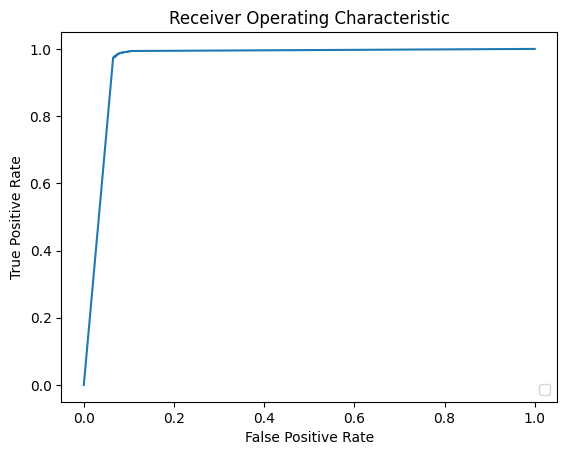

In [86]:
import matplotlib.pyplot as plt

test_acc = probe.get_probe_accuracy(X_test, y_test, device="cuda")
test_auc = probe.get_probe_auc(X_test, y_test, device="cuda")

print(f"Test Accuracy: {test_acc}")
print(f"Test AUC: {test_auc}")

from sklearn.metrics import roc_curve, RocCurveDisplay

probas = probe.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test.detach().cpu().numpy(), probas.detach().cpu().numpy())

roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)
roc_display.plot()
plt.title('Receiver Operating Characteristic')
plt.show()

Test Accuracy: 0.7470666666666667
Test AUC: 0.8164130233814996


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


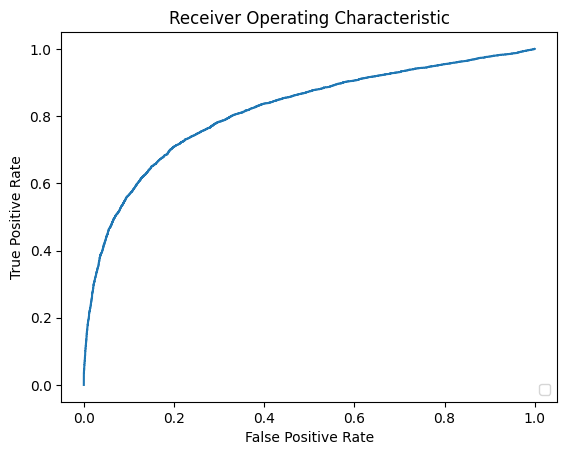

In [61]:
import matplotlib.pyplot as plt

y_pred = probe_lr.predict(X_test.cpu().numpy())

# Calculate the accuracy
accuracy = accuracy_score(y_test.numpy(), y_pred)

# Calculate the AUC
auc = roc_auc_score(y_test.numpy(), probe_lr.predict_proba(X_test.cpu().numpy())[:, 1])

print(f"Test Accuracy: {accuracy}")
print(f"Test AUC: {auc}")

from sklearn.metrics import roc_curve, RocCurveDisplay

probas = probe_lr.predict_proba(X_test.cpu().numpy())
fpr, tpr, _ = roc_curve(y_test.detach().cpu().numpy(), probas[:, 1])

roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)
roc_display.plot()
plt.title('Receiver Operating Characteristic')
plt.show()

In [93]:
#* sample efficiency plot
lr = 0.01
weight_decay = 1
epochs = 500
use_bias = True

# num_dps = list(range(1, int(X_train.shape[0] / 5) + 1))

num_dps = [1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384, X_train.shape[0]]
accs = []
aucs = []
num_its = 5
for num_dp in tqdm(num_dps):
    tot_accs = []
    tot_aucs = []
    for _ in range(num_its):
        probe = LRProbe.from_data(X_train[:num_dp * 5], y_train[:num_dp * 5], 
                                lr = lr, 
                                weight_decay = weight_decay, 
                                epochs = epochs, 
                                use_bias = use_bias,
                                device = "cuda", )
        tot_accs.append(probe.get_probe_accuracy(X_val, y_val, device = "cuda"))
        tot_aucs.append(probe.get_probe_auc(X_val, y_val, device = "cuda"))
    
    accs.append(np.mean(tot_accs))
    aucs.append(np.mean(tot_aucs))

  0%|          | 0/16 [00:00<?, ?it/s]

100%|██████████| 16/16 [01:01<00:00,  3.84s/it]


In [94]:
import plotly.graph_objects as go

# Create a figure
fig = go.Figure()

# Create a line plot for Accuracy
fig.add_trace(go.Scatter(x=list(range(len(accs))), y=accs, mode='lines+markers', name='Accuracy'))

# Create a line plot for AUC
fig.add_trace(go.Scatter(x=list(range(len(accs))), y=aucs, mode='lines+markers', name='AUC'))

# Update the layout with x-axis labels and titles
fig.update_xaxes(title_text="Number of Data Points")
fig.update_yaxes(title_text="Acc/AUC")
fig.update_layout(title="Accuracy and AUC vs Number of Data Points")
fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = list(range(len(accs))),
        ticktext = num_dps,
    )
)
# Show the combined figure
fig.show()


## generalization datasets

In [95]:
generalization_dataset = load_from_disk(os.path.join(path, 'generalization_datasets'))

### fuzzy pos

Take rows with tok_by_tok between 0.9 and 0.99 on the llama_ground_data.csv / all_hidden_states.pt, which are not used in training at all and get recall

In [96]:
fuzzy_pos_dataset = generalization_dataset['fuzzy_pos']

In [102]:
len(fuzzy_pos_dataset['orig_idx']), len(set(fuzzy_pos_dataset['orig_idx']))

(667, 667)

In [103]:
fuzzy_states = dataset_to_states(fuzzy_pos_dataset)

In [105]:
fuzzy_pos_X, fuzzy_pos_y = get_token_states(fuzzy_states, fuzzy_pos_dataset, TOK_IDXS, LAYER)

In [106]:
acc = probe.get_probe_accuracy(fuzzy_pos_X, fuzzy_pos_y, device = "cuda")

print(f"PROBE LAYER {LAYER} TOKEN {TOK_IDXS}")
print(f"Accuracy {acc}")
print()

PROBE LAYER 16 TOKEN [5, 6, 7, 8, 9]
Accuracy 0.8461769223213196



In [ ]:
acc = accuracy_score(fuzzy_pos_y.numpy(), probe_lr.predict(fuzzy_pos_X.cpu().numpy()))
acc

### prefix

#### test on prefix dataset

In [108]:
prefix_dataset = generalization_dataset['prefix']

N = 1000
prefix_samples = prefix_dataset[:N]['input_ids']

In [111]:
import gc
def ceildiv(a, b):
    return -(a // -b)

LAYER = 16
save_every = 25
hidden_states = []  
for batch_idx in tqdm(range(ceildiv(len(prefix_samples), save_every))):        
    batch = prefix_samples[batch_idx * save_every : (batch_idx + 1) * save_every]
            
    batch_act_dict = mw.batch_hiddens(
                batch,
                layers = [LAYER],
                tok_idxs = -1,
                return_types = ['resid'],
                )

    hidden_states.append(batch_act_dict['resid'][LAYER])
    
    gc.collect()
    torch.cuda.empty_cache()

You're using a GPTNeoXTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


In [112]:
prefix_X = torch.cat(hidden_states, dim = 0)

prefix_labels = prefix_dataset[:N]['labels']
prefix_y = torch.tensor(prefix_labels).float()

prefix_acc = probe.get_probe_accuracy(prefix_X[:N], prefix_y, device="cuda")
prefix_auc = probe.get_probe_auc(prefix_X[:N], prefix_y, device="cuda")
print(f"Prefix Accuracy: {prefix_acc}")
print(f"Prefix AUC: {prefix_auc}")

Prefix Accuracy: 0.8830000162124634
Prefix AUC: 0.9661490322864608


### quotes

#### generate quotes dataset

In [116]:
import time
import requests

all_quotes = []
for i in tqdm(range(100)):
    quotes = requests.get('https://zenquotes.io/api/quotes').json()
    all_quotes.extend([q['q'] for q in quotes])
    time.sleep(1)
    
    if i % 10 == 0:
        time.sleep(5)
all_quotes = [quote for quote in all_quotes if quote != "Too many requests. Obtain an auth key for unlimited access."]
len(all_quotes) 

100%|██████████| 100/100 [02:40<00:00,  1.60s/it]


1550

In [117]:
data_dir = "../act-add-suite/data/memorization"

with open(os.path.join(data_dir, "quotes/popular_quotes.json")) as file:
    seen_quotes = json.load(file)

with open(os.path.join(data_dir, "quotes/unseen_quotes.json")) as file:
    unseen_quotes = json.load(file)
    
format_fn = lambda s : "{s} ".format(s=s) 

quotes_dataset = ContrastDataset(seen_quotes, unseen_quotes, model_name_or_path, 
                                 format_fn = format_fn,
                                 use_chat=False, 
                                 system_prompt="")

train_data, test_data, train_labels, test_labels = quotes_dataset.gen_train_test_split(48, seed = 0)

all_quotes.extend(train_data[::2])

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [118]:
from utils import eval_completions

quotes_first_half = []
completions = []
for quote in all_quotes:
    quote_parts = quote.split()
    first_half = " ".join(quote_parts[:len(quote_parts)//2])
    second_half = " ".join(quote_parts[len(quote_parts)//2:])
    quotes_first_half.append(first_half)

# Generate completions in batches:
completions = []
bs = 50
for i in tqdm(range(0, len(quotes_first_half), bs)):
    completions.extend(mw.batch_generate_autoreg(quotes_first_half[i:i+bs], max_new_tokens=10))

100%|██████████| 32/32 [00:41<00:00,  1.29s/it]


In [120]:
evaluations = eval_completions(completions, all_quotes, sim_types = ['char', 'lev'], return_mean = False, tokenizer = None)

# Print the evaluations
counter =0 
memmed_quotes_idxs = []
for i in range(len(all_quotes)):
    if evaluations['char_by_char_similarity'][i] >= 0.9:
        print("Memmed quote:")
        counter +=1
        memmed_quotes_idxs.append(i)
    else:
        print("Unmemmed quote:")
    print(f"Quote: {all_quotes[i]}")
    print(f"Completion: {completions[i]}")
    print(f"char: {evaluations['char_by_char_similarity'][i]}")
    print(f"lev: {evaluations['lev_distance'][i]}")
    print()
    
print(counter)

Unmemmed quote:
Quote: Smell the cheese often so you know when it is getting old.
Completion: Smell the cheese often so you can smell the cheese.

Smell the
char: 0.5
lev: 0.5645161290322581

Unmemmed quote:
Quote: Leadership starts at the top.
Completion: Leadership starts with the leader.

Leadership is not
char: 0.4
lev: 0.4716981132075472

Unmemmed quote:
Quote: The wisdom of life consists in the elimination of the nonessentials.
Completion: The wisdom of life consists in the ability to adapt to change.


char: 0.5517241379310345
lev: 0.6176470588235294

Unmemmed quote:
Quote: When it comes to mastering a skill, time is the magic ingredient.
Completion: When it comes to mastering a new language, it’s important to have a
char: 0.43636363636363634
lev: 0.5223880597014925

Unmemmed quote:
Quote: You can only lose something that you have, but you cannot lose something that you are.
Completion: You can only lose something that you have, and you can only gain something that you have.
cha

In [126]:
memmed_quotes = pickle.load(open(f'{path}/memmed_quotes.pkl', 'rb'))
for idx in memmed_quotes_idxs:
    memmed_quotes.append(all_quotes[idx])

unmemmed_quotes = []
for idx in range(len(all_quotes)):
    if idx not in memmed_quotes_idxs:
        unmemmed_quotes.append(all_quotes[idx])

import pickle
with open(os.path.join('data/6.9b/quotes_dict.pkl'), 'wb') as f:
    pickle.dump({'memmed_quotes': list(set(memmed_quotes)),
                 'unmemmed_quotes': list(set(unmemmed_quotes))}, f)


#### test quotes

In [133]:
quotes_dict = pickle.load(open(f'{path}/quotes_dict.pkl', 'rb'))
total_quotes = quotes_dict['memmed_quotes'] + quotes_dict['unmemmed_quotes'][:len(quotes_dict['memmed_quotes'])]
quotes_labels = [1] * len(quotes_dict['memmed_quotes']) + [0] * len(quotes_dict['memmed_quotes'])

In [132]:
out = mw.batch_hiddens(total_quotes, layers = list(range(mw.model.config.num_hidden_layers)), tok_idxs = [-1, -2, -3, -4, -5])

In [144]:
idx = 1
acc = probe.get_probe_accuracy(out['resid'][LAYER][:, idx], torch.tensor(quotes_labels).float(), device = "cuda")
auc = probe.get_probe_auc(out['resid'][LAYER][:, idx], torch.tensor(quotes_labels).float(), device = "cuda")
print(acc, auc)

0.7120000123977661 0.864


In [ ]:
import matplotlib.pyplot as plt
from sklearn.calibration import calibration_curve

def plot_calib_curve(probe, X, y):
    # Get the predicted probabilities for the positive class
    y_pred_proba = probe.predict_proba(X)[:, 1]

    # Calculate the calibration curve
    fraction_of_positives, mean_predicted_value = calibration_curve(y, y_pred_proba, n_bins=10)

    # Plot the calibration curve
    plt.plot(mean_predicted_value, fraction_of_positives, 's-', label='Calibration Curve')
    plt.plot([0, 1], [0, 1], '--', color='gray', label='Perfectly Calibrated')
    plt.xlabel('Mean Predicted Value')
    plt.ylabel('Fraction of Positives')
    plt.title('Calibration Curve')
    plt.legend()
    plt.show()

plot_calib_curve(probe_lr, out['resid'][LAYER].numpy(), quotes_labels)


### private information

#### generate dataset

In [147]:
pythia_69b_memdata = load_dataset('EleutherAI/pythia-memorized-evals')['duped.6.9b']

In [167]:
bs = 500

pythia_69b_memtext = []
for i in tqdm(range(0, len(pythia_69b_memdata), bs)):
    pythia_69b_memtext.extend(tokenizer.batch_decode(pythia_69b_memdata[i:i+bs]['tokens']))

  0%|          | 0/4242 [00:00<?, ?it/s]

100%|██████████| 4242/4242 [10:56<00:00,  6.47it/s]


In [176]:
email_samples = [(i, t) for i, t in enumerate(pythia_69b_memtext) if ('@gmail' in t) or  ('@hotmail' in t) or ('@yahoo' in t)]

In [190]:
email_samples[:10]

[(95,
  '.1@gmail.com>\n//\n// This Source Code Form is subject to the terms of the Mozilla\n// Public License v. 2.0. If a copy of the MPL was not distributed\n// with this file, You can obtain one at http://mozilla.org/MPL/2.'),
 (2462,
  ' ST Microelectronics\n * Shiraz Hashim <shiraz.linux.kernel@gmail.com>\n *\n * This file is licensed under the terms of the GNU General Public\n * License version 2. This program is licensed "as is" without any\n * warranty of any kind, whether express'),
 (3783,
  'owdry@gmail.com -Ashlee<|endoftext|>/* This Source Code Form is subject to the terms of the Mozilla Public\n * License, v. 2.0. If a copy of the MPL was not distributed with this\n * file, You can obtain one at http://mozilla.org/MPL/2'),
 (4071,
  ' happily together today, That man is great, you can contact him via email liberationlovespell@gmail.com… Now i will advice any serious persons that found themselves in this kind of problem to contact him now a fast solution without steress..

In [191]:
split_emails = []
for idx, email in email_samples:
    if '@gmail' in email:
        split_emails.extend([f"{s}@gmail.com" for i, s in enumerate(email.split('@gmail.com')) if i < len(email.split('@gmail.com')) - 1])
    elif '@hotmail' in email:
        split_emails.extend([f"{s}@hotmail.com" for i, s in enumerate(email.split('@hotmail.com')) if i < len(email.split('@hotmail.com')) - 1])
    elif '@yahoo' in email:
        split_emails.extend([f"{s}@yahoo.com" for i, s in enumerate(email.split('@yahoo.com')) if i < len(email.split('@yahoo.com')) - 1])

In [195]:
prepped_emails = []
for email in split_emails:
    if len(email) < 25:
        continue
    prepped_emails.append(email)
    
len(prepped_emails)

3348

In [196]:
prepped_emails

[' ST Microelectronics\n * Shiraz Hashim <shiraz.linux.kernel@gmail.com',
 ' happily together today, That man is great, you can contact him via email liberationlovespell@gmail.com',
 ' feedback to suvrossudip@gmail.com',
 "<|endoftext|>/* Inicialització en català per a l'extensió 'UI date picker' per jQuery. */\n/* Writers: (joan.leon@gmail.com",
 '-mac/src/node_modules/anymatch",\n  "author": {\n    "email": "sindresorhus@gmail.com',
 ' opposite of what most people describe.<|endoftext|>.. Copyright (C) 2016-2017 Maciej Delmanowski <drybjed@gmail.com',
 ' Board of Education seats runs from June 28 until July 2. The election will be held Nov. 2<|endoftext|>//---------------------------------------------------------------------------//\r\n// Copyright (c) 2013 Kyle Lutz <kyle.r.lutz@gmail.com',
 'kevinkucharczyk@gmail.com',
 '2008 Dave Airlie <airlied@linux.ie>\n * Copyright (c) 2007-2008 Jakob Bornecrantz <wallbraker@gmail.com',
 '\n\t\t\t"url": "http://scottgonzalez.com"\n\t\t},\n\t\t

In [173]:
pickle.dump(email_samples, open(f'{path}/email_samples.pkl', 'wb'))

## disproving confidence direction hypothesis

get a dataset of few shot prompting induction task where the model is super confident in its completions
assert that the model has not memorized these sequences by making them pretty random and then see what the probe performance on that is

get a dataset of hidden states from the pile where the model is >0.99 confident in its answer
assert that the model has not memorized the pile sequence and then see what the probe performance on that is

### few shot

In [49]:
import random

def generate_random_strings(num_prompts, num_repeats):
    strings = []
    for _ in range(num_prompts):
        number = str(random.randint(1_000_000_000, 9_999_999_999))
        random_numbers = [number for _ in range(num_repeats)]
        string = '\n'.join(random_numbers)
        string += '\n'
        strings.append(string)
    return strings

few_shot_confidence_prompts = generate_random_strings(50, 10)

In [50]:
print(few_shot_confidence_prompts[0])
mw.query_tok_dist(few_shot_confidence_prompts[0])

8409421407
8409421407
8409421407
8409421407
8409421407
8409421407
8409421407
8409421407
8409421407
8409421407



[(0.98681640625, '8'),
 (0.002685546875, '\n'),
 (0.00048160552978515625, '<|endoftext|>'),
 (0.0003552436828613281, 'END'),
 (0.00033092498779296875, '83'),
 (0.00025391578674316406, '0'),
 (0.0002498626708984375, '4'),
 (0.00023472309112548828, '84'),
 (0.0002071857452392578, '-'),
 (0.0001690387725830078, '3')]

In [51]:
LAYER = 16
few_shot_confidence_states = mw.batch_hiddens(few_shot_confidence_prompts, layers = list(range(mw.model.config.num_hidden_layers)), tok_idxs = -1)['resid'][LAYER]

In [53]:
pred_probas = probe.predict_proba(few_shot_confidence_states)
torch.mean(pred_probas), torch.std(pred_probas)

(tensor(1., device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(0., device='cuda:0', grad_fn=<StdBackward0>))

In [54]:
px.histogram(pred_probas.detach().cpu().numpy())

### high confidence pile

In [28]:
from utils import gen_pile_data

pile_prompts = gen_pile_data(500, tokenizer, min_n_toks = 64)
pile_tokens = torch.tensor(tokenizer(pile_prompts, truncation = True, max_length = 64)['input_ids'])

Resolving data files: 100%|██████████| 1650/1650 [00:00<00:00, 3698.44it/s]


In [30]:
pile_tokens = pile_tokens[:50, :]
pile_tokens.shape

torch.Size([50, 64])

In [32]:
#* assert that prompts are not memorized
from utils import tok_by_tok_similarity, char_by_char_similarity, levenshtein_distance
pile_gen_str = []
pile_gen_toks = []
pile_mem_status = {
    'char_by_char_sim': [],
    'lev_distance': [],
    'tok_by_tok_sim': [],
}
pile_states = []
batch_size = 5

for batch_idx in tqdm(range(int(len(pile_tokens) // batch_size))):
    batch = pile_tokens[batch_idx * batch_size : (batch_idx + 1) * batch_size]

    out = mw.batch_generate_autoreg(prompts=pile_tokens[:, :32],
                max_new_tokens=32,
                output_hidden_states=True,
                output_tokens=True,
                layers = list(range(mw.num_layers)),
                tok_idxs = list(range(63)),
                return_prompt_acts=True,
                do_sample = False,
                )

    pile_gen_str.extend(out['generations'])
    pile_gen_toks.extend(out['tokens'].cpu().numpy().tolist())

    pile_mem_status['tok_by_tok_sim'].extend(tok_by_tok_similarity(pile_gen_toks[-len(batch):], batch))
    pile_mem_status['char_by_char_sim'].extend(char_by_char_similarity(mw.tokenizer.batch_decode(batch ), out['generations']))
    pile_mem_status['lev_distance'].extend(levenshtein_distance(mw.tokenizer.batch_decode(batch), out['generations']))
    
    mem_batch_idxs = [i for i, mem in enumerate(pile_mem_status['tok_by_tok_sim'][-len(batch):]) if mem < 0.6]
    unmemmed_states = out['hidden_states'].cpu()[mem_batch_idxs]
    
    pile_states.extend(unmemmed_states)
    

In [33]:
#* get hidden states of high confidence token positions
unmemmed_pile_toks = np.array(pile_gen_toks)[np.where(np.array(pile_mem_status['tok_by_tok_sim']) < 0.6)[0]].tolist()
unmemmed_pile_gens = np.array(pile_gen_str)[np.where(np.array(pile_mem_status['tok_by_tok_sim']) < 0.6)[0]].tolist()

In [43]:
#* run the probe on those high confidence hidden states
#* run the probe on those high confidence hidden states

def logit_lens_states(mw, states, TOP_K = 1):
    #states should be shape batch x layer x d_m
    
    logits = mw.model.embed_out(mw.model.gpt_neox.final_layer_norm(states))
    probs = F.softmax(logits, dim = -1).detach().cpu()
    assert torch.allclose(torch.sum(probs, dim = -1), torch.ones_like(torch.sum(probs, dim = -1)), atol=0.01), "probs don't add to 1"

    max_tuple = torch.max(probs, dim = -1)
    indices = max_tuple.indices
    probs = max_tuple.values

    tokens = mw.tokenizer.batch_decode(indices.reshape(-1, 1))

    tokens = np.array(tokens).reshape(states.shape[0], mw.num_layers)
    
    return tokens, probs

In [44]:
high_confidence_states = []
pile_states = torch.stack(pile_states, dim = 0)
n_seqs = pile_states.shape[0]
for i in tqdm(range(n_seqs)):
    tokens, probs = logit_lens_states(mw, pile_states[i].reshape(-1, mw.num_layers, 4096))
    high_confidence_states.extend(pile_states[i][:, torch.where(probs[:, -1] > 0.9)[0]].reshape(-1, mw.num_layers, 4096))

In [46]:
high_conf_states = torch.stack(high_confidence_states, dim = 0)[:, LAYER].float()
probas = probe.predict_proba(high_conf_states)

In [47]:
torch.mean(probas), torch.std(probas)

(tensor(4.8930e-16, device='cuda:0', grad_fn=<MeanBackward0>),
 tensor(6.8640e-16, device='cuda:0', grad_fn=<StdBackward0>))

In [48]:
px.histogram(probas.detach().cpu().numpy())

## Rejection sampling

In [71]:
out = mw.rej_sampl_generate(["1 2 3 4 5", "i like dogs and cats"],probe = probe, probe_layer = LAYER, max_new_tokens = 10, rej_sample_length=5, log_rej_samples=True)

KeyboardInterrupt: 

In [70]:
out

['1 2 3 4 51 2 3 4 5 6\nQ:\n\nHow',
 'i like dogs and catsi like dogs and cats and other animals, and i like to play with']

In [65]:
probe.net[0].weight

Parameter containing:
tensor([[ 0.0332,  0.3652, -0.0165,  ...,  0.1508,  0.2118,  0.0214]],
       device='cuda:0', requires_grad=True)

## logit lens

In [7]:
llama_states.shape

torch.Size([9865, 32, 10, 4096])

In [70]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [13]:
llama_states[0, :, 0].shape

torch.Size([32, 4096])

In [86]:
mw = ModelWrapper(model = model, tokenizer = tokenizer)

def logit_lens_states(mw, states, TOP_K = 1):
    #states should be shape batch x layer x d_m
    
    logits = mw.model.lm_head(mw.model.model.norm(states))
    probs = F.softmax(logits, dim = -1).detach().cpu()
    assert torch.allclose(torch.sum(probs, dim = -1), torch.ones_like(torch.sum(probs, dim = -1)), atol=0.01), "probs don't add to 1"

    max_tuple = torch.max(probs, dim = -1)
    indices = max_tuple.indices
    probs = max_tuple.values

    tokens = mw.tokenizer.batch_decode(indices.reshape(-1, 1))

    tokens = np.array(tokens).reshape(states.shape[0], mw.num_layers)
    
    return tokens, probs

def num_layers_known(logits):
    changes = []
    for row in logits:
        prev_token = row[-1]
        for i in range(len(row)-2, -1, -1):
            if row[i] != prev_token:
                changes.append(len(row) - i - 1)
                break
            prev_token = row[i]
    return changes

In [82]:
TOK_IDX = 6
memmed_states = llama_states[llama_mem_data[llama_mem_data['char_by_char_sim'] == 1].index][:, :, TOK_IDX]

In [87]:
logits, probs = logit_lens_states(mw, memmed_states)
logit_info = num_layers_known(logits)

In [84]:
np.mean(logit_info), np.std(logit_info)

(8.616740088105727, 5.768537018076731)

In [97]:
logits[10:15]

array([['ting', 'whe', 'whe', 'dra', 'Champions', 'Heimat', 'Riv', 'Hö',
        'itle', 'ץ', 'фо', 'фо', 'ioso', 'données', 'données', 'données',
        'données', 'war', 'war', 'war', 'war', 'any', 'any', 'war',
        'war', 'war', 'war', 'any', 'any', 'any', 'AN', 'AN'],
       ['archivi', 'der', 'der', 'ette', 'der', 'kwiet', 'utt', 'kwiet',
        'kwiet', 'utt', 'utt', 'utt', 'kwiet', 'oph', 'bert', 'ensed',
        'ensed', 'enses', 'ensed', 'ensed', 'ensed', 'enses', 'enses',
        'enses', 'enses', 'enses', 'enses', 'enses', 'enses', 'ense',
        'EN', 'EN'],
       ['th', 'ież', 'Mass', 'dex', '�', 'Edit', 'сор', 'cowo', 'bau',
        'app', 'Da', 'Da', '̯', 'th', 'F', 'th', 'F', 'F', 'F', 'F', 'F',
        'f', 'f', 'F', 'f', 'f', 'f', 'f', 'f', 'f', 'f', 'f'],
       ['nbsp', 'nbsp', 'amp', 'amp', 'amp', 'amp', 'archiviato', 'amp',
        'Hart', 'Hart', 'Hart', 'nbsp', 'nbsp', 'nbsp', 'nbsp', 'amp',
        'amp', 'amp', 'nbsp', 'nbsp', 'nbsp', 'nbsp', 'nbsp', '

In [94]:
np.mean(probs[:, -1].numpy()), np.std(probs[:, -1].numpy())

(0.9463, 0.1241)

In [85]:
px.histogram(logit_info)

In [77]:
TOK_IDX = 9
un_memmed_states = llama_states[llama_mem_data[llama_mem_data['char_by_char_sim'] < 0.4].index][:, :, TOK_IDX]
un_memmed_states.shape

torch.Size([573, 32, 4096])

In [78]:
logits = logit_lens_states(mw, un_memmed_states)
logit_info = num_layers_known(logits)

In [79]:
np.mean(logit_info), np.std(logit_info)

(6.484154929577465, 5.666471906161784)

In [81]:
px.histogram(logit_info)

In [100]:
mw.query_tok_dist("In the end, we will remember not the words of our enemies, but the")

[(0.9969713687896729, 'silence'),
 (0.0016206820728257298, 'sil'),
 (0.0003701986570376903, 'words'),
 (0.000148409788380377, 'silent'),
 (0.00011028879816876724, 'distance'),
 (9.287247667089105e-05, 'Sil'),
 (7.346817437792197e-05, '<0x0A>'),
 (4.285361137590371e-05, 'quiet'),
 (3.752387419808656e-05, 'voice'),
 (2.9452827220666222e-05, 'love')]

In [102]:
hids = mw.batch_hiddens(["In the end, we will remember not the words of our enemies, but the"], layers = list(range(32)))

In [120]:
llama_mem_data[llama_mem_data['char_by_char_sim'] == 1].loc[18].gen_str

' 2016 gRPC authors.\n *\n * Licensed under the Apache License, Version 2.0 (the "License");\n * you may not use this file except in compliance with the License.\n * You may obtain a copy of the License at\n *\n'

In [135]:
mw.query_tok_dist(' 2016 gRPC authors.')

[(0.6307439208030701, '<0x0A>'),
 (0.1291484534740448, ''),
 (0.07021679729223251, 'All'),
 (0.05821176618337631, ' '),
 (0.010895024053752422, 'The'),
 (0.007878106087446213, 'This'),
 (0.006016803905367851, '</s>'),
 (0.0036779982037842274, 'I'),
 (0.0021876709070056677, '['),
 (0.0021706463303416967, 'In')]

## Clustering

### PCA 

In [22]:
from sklearn.decomposition import PCA
LAYER = 13
TOKEN_IDX = 5

In [23]:
from sklearn.preprocessing import StandardScaler
X = llama_states[:, LAYER, TOKEN_IDX, :].numpy()

scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

pca = PCA(n_components=10)
mem_pca_result = pca.fit_transform(X_normalized)

In [24]:
unmem_mem_list = ["mem"]*5000 + ["unmem"]*5000

In [35]:
pc_x = 6
pc_y = 2
pca_df = pd.DataFrame.from_dict({"x" : mem_pca_result[:, pc_x], 
                        "y" : mem_pca_result[:, pc_y], 
                        "category": unmem_mem_list,
                        # "category" : new_categories,
                        'index': list(range(len(mem_pca_result))),
                        'gen_str': llama_mem_data['gen_str'],
                        # 'json': gpt4_cluster_labels}
                        })
fig = px.scatter(pca_df, x="x", y="y", 
                 color="category", 
                 hover_data=['gen_str']
                 )
fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}',
    showlegend=True
)

fig.show()

In [34]:
import re
def remove_punc(string):
    return re.sub(r'[\[\]._,\-]', '', string)

def remove_non_numeric(string):
    return re.sub(r'[^\d]', '', string)

def check_repeated_string(string):
    # Remove periods, underscores, dashes, and other special characters
    string = remove_punc(string)
    words = string.split()
    if len(words) == 0:
        return False
    else:
        return all(words[i] == words[i+1] for i in range(len(words)-1))
    
def check_increment(string):
    # Remove periods, underscores, dashes, and other special characters
    
    numbers = [int(remove_punc(word.strip())) for word in string.split() if remove_punc(word.strip()).isdigit()]
    print(numbers)
    if len(numbers) == 0 or len(numbers) == 1:
        return False
    else:
        all_inc = all(numbers[i] == numbers[i+1] - 1 for i in range(len(numbers)-1)) 
        all_dec = all(numbers[i] ==  numbers[i+1] + 1 for i in range(len(numbers)-1))
        # alt_dec_0 = all(numbers[i] < numbers[i+1] for i in list(range(len(numbers)-1))[::2]) 
        alt_inc_0 = all(numbers[i] > numbers[i+1] for i in list(range(len(numbers)-1))[::2])
        # all_dec_1 = all(numbers[i] < numbers[i+1] for i in list(range(len(numbers)-1))[1::2])
        # all_inc_1 = all(numbers[i] > numbers[i+1] for i in list(range(len(numbers)-1))[1::2])
        return all_inc or all_dec or alt_inc_0
        # or alt_dec_0 or alt_inc_0 or all_dec_1 or all_inc_1

print(check_increment("15 16 17"))
print(check_increment("15. Chapter 9 16. Chapter 10 17. Chapter 11"))
print(check_increment("327. 328. 329. 330."))
print(check_increment("Volume_2_155 996. Volume_2_156 997. Volume_2_157 998."))
print(check_increment("qr[3]; h qr[4]; h qr[5];"))
print(check_increment('copy = 3 + BITS(2);\n                        DROPBITS(2);\n                    }\n                    else if (copy == 1) {\n                        DROPBITS(1);\n                    }\n                    else {\n                        DROPBITS'))
print(check_increment(' * the points, so when setting a specific link color, consider setting the\n * `fillOpacity` to 1.\n *\n * @param {String} [color] Color of the link. When not supplied, the color\n *     will be `color` of the parent element.'))
print(check_increment('/LGPL 2.1\n *\n * The contents of this file are subject to the Mozilla Public License Version\n * 1.1 (the "License"); you may not use this file except in compliance with\n * the License.'))

[15, 16, 17]
True
[15, 9, 16, 10, 17, 11]
True
[327, 328, 329, 330]
True
[996, 997, 998]
True
[]
False
[3]
False
[1]
False
[21, 11]
True


In [90]:
remove_punc("qr[3];")

'qr3;'

In [64]:
check_increment("Volume_2_155 996. Volume_2_156 997. Volume_2_157 998.")

True

In [39]:
pca.explained_variance_ratio_

array([0.02244112, 0.01586624, 0.01131825, 0.00867876, 0.00765402,
       0.0068775 , 0.00624204, 0.00616781, 0.00586082, 0.00513719])